In [1]:
# Run Inference

import cv2
from ultralytics import YOLO

model = YOLO("yolov8n.pt")
image = cv2.imread('1.jpg')
results = model(image)[0]


0: 480x640 11 persons, 22 cars, 2 trucks, 7 traffic lights, 86.6ms
Speed: 6.1ms preprocess, 86.6ms inference, 6.1ms postprocess per image at shape (1, 3, 480, 640)


In [7]:
# Load Predictions into Supervision
import cv2
import supervision as sv
from ultralytics import YOLO

model = YOLO("yolov8n.pt")
image = cv2.imread('1.jpg')
results = model(image)[0]
detections = sv.Detections.from_ultralytics(results)


0: 480x640 11 persons, 22 cars, 2 trucks, 7 traffic lights, 53.7ms
Speed: 2.1ms preprocess, 53.7ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


In [ ]:
# from_deepsparse (Deepsparse)
# from_detectron2 (Detectron2)
# from_mmdetection (MMDetection)
# from_inference (Roboflow Inference)
# from_sam (Segment Anything Model)
# from_transformers (HuggingFace Transformers)
# from_yolo_nas (YOLO-NAS)


0: 480x640 11 persons, 22 cars, 2 trucks, 7 traffic lights, 170.8ms
Speed: 6.0ms preprocess, 170.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


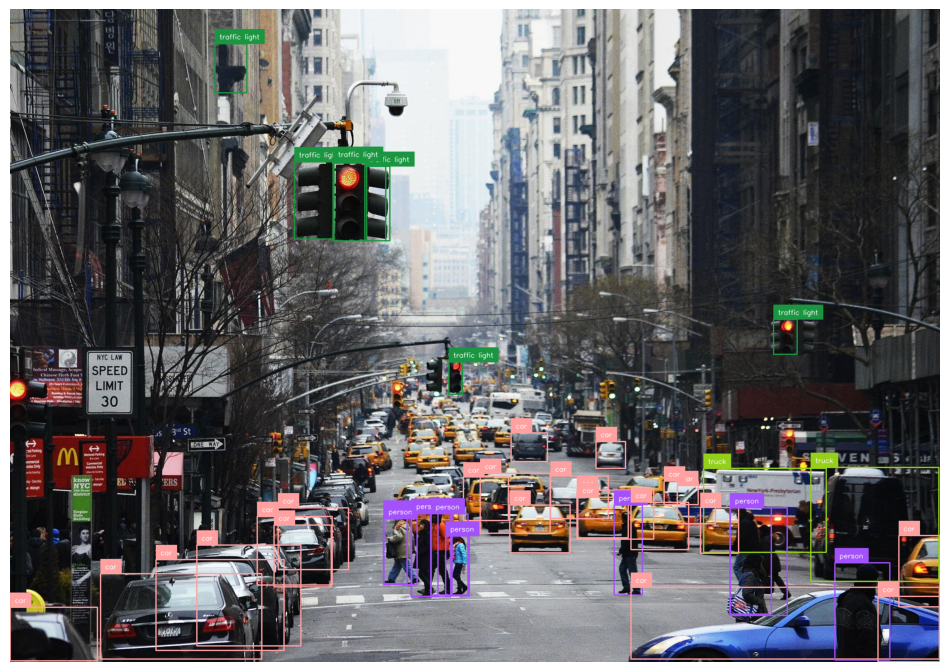

In [22]:
# Annotate Image

model = YOLO("yolov8n.pt")
image = cv2.imread('1.jpg')
results = model(image)[0]
detections = sv.Detections.from_ultralytics(results)

bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()

labels = [
    model.model.names[class_id]
    for class_id
    in detections.class_id
]

annotated_image = bounding_box_annotator.annotate(
    scene=image, detections=detections)
BB_annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)

sv.plot_image(BB_annotated_image)

In [20]:
# Mask Annotator

model = YOLO("yolov8n.pt")
image = cv2.imread('1.jpg')
results = model(image)[0]
detections = sv.Detections.from_ultralytics(results)

Mask_annotator = sv.MaskAnnotator()
label_annotator = sv.LabelAnnotator()

labels = [
    model.model.names[class_id]
    for class_id
    in detections.class_id
]

annotated_image = Mask_annotator.annotate(
    scene=image, detections=detections)
Mask_annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)


0: 480x640 11 persons, 22 cars, 2 trucks, 7 traffic lights, 215.9ms
Speed: 5.8ms preprocess, 215.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


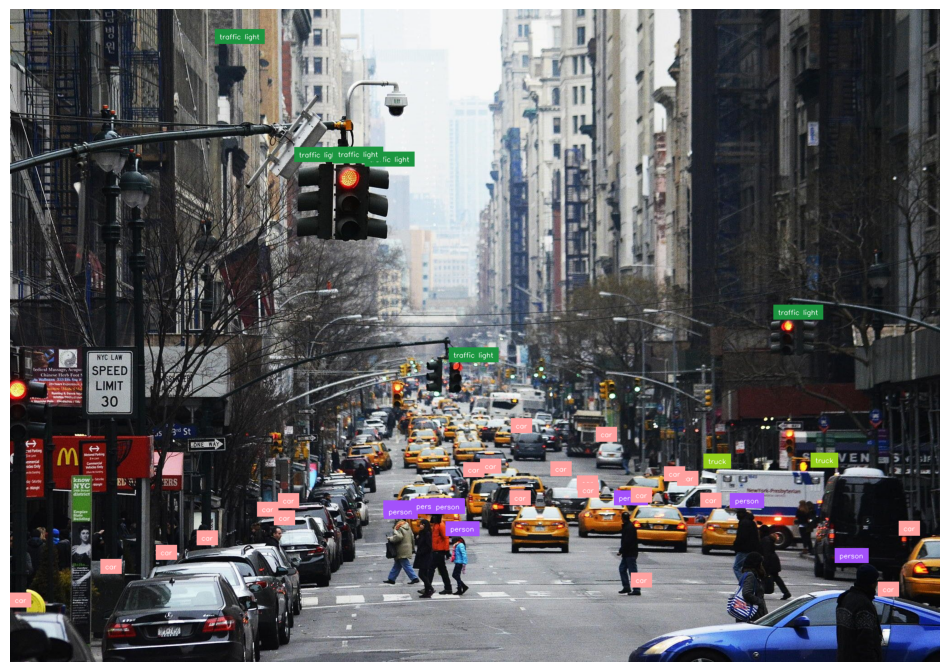

In [21]:
# Display Annotated Image
sv.plot_image(Mask_annotated_image)

In [14]:
# Track Objects

from supervision.assets import download_assets, VideoAssets
download_assets(VideoAssets.MILK_BOTTLING_PLANT)
# download_assets(VideoAssets.PEOPLE_WALKING)

100%|█████████████████████████████████████████████████████████████████████████████| 2.61M/2.61M [00:00<00:00, 9.11MB/s]


'milk-bottling-plant.mp4'

In [14]:
# Run Inference

import numpy as np
model = YOLO("yolov8n.pt")
box_annotator = sv.BoundingBoxAnnotator()

def callback(frame: np.ndarray, _: int) -> np.ndarray:
    results = model(frame)[0]
    detections = sv.Detections.from_ultralytics(results)
    return box_annotator.annotate(frame.copy(), detections=detections)

sv.process_video(
    source_path="people-walking.mp4",
    target_path="result.mp4",
    callback=callback
)


0: 384x640 37 persons, 2 birds, 221.6ms
Speed: 7.1ms preprocess, 221.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 38 persons, 3 birds, 150.2ms
Speed: 3.6ms preprocess, 150.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 35 persons, 3 birds, 141.8ms
Speed: 4.0ms preprocess, 141.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 37 persons, 3 birds, 143.8ms
Speed: 3.7ms preprocess, 143.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 37 persons, 2 birds, 145.5ms
Speed: 4.5ms preprocess, 145.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 38 persons, 2 birds, 158.8ms
Speed: 3.5ms preprocess, 158.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 36 persons, 2 birds, 150.4ms
Speed: 3.6ms preprocess, 150.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 36 persons, 2 b

In [15]:
# Tracking

model = YOLO("yolov8n.pt")
tracker = sv.ByteTrack()
box_annotator = sv.BoundingBoxAnnotator()

def callback(frame: np.ndarray, _: int) -> np.ndarray:
    results = model(frame)[0]
    detections = sv.Detections.from_ultralytics(results)
    detections = tracker.update_with_detections(detections)
    return box_annotator.annotate(frame.copy(), detections=detections)

sv.process_video(
    source_path="people-walking.mp4",
    target_path="result1.mp4",
    callback=callback
)


0: 384x640 37 persons, 2 birds, 189.7ms
Speed: 5.7ms preprocess, 189.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 38 persons, 3 birds, 156.3ms
Speed: 3.8ms preprocess, 156.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 35 persons, 3 birds, 177.8ms
Speed: 3.8ms preprocess, 177.8ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 37 persons, 3 birds, 159.8ms
Speed: 3.9ms preprocess, 159.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 37 persons, 2 birds, 154.5ms
Speed: 3.1ms preprocess, 154.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 38 persons, 2 birds, 154.4ms
Speed: 5.3ms preprocess, 154.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 36 persons, 2 birds, 150.3ms
Speed: 3.9ms preprocess, 150.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 36 persons, 2 b

In [16]:
# Annotate Video with Tracking IDs

model = YOLO("yolov8n.pt")
tracker = sv.ByteTrack()
box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()

def callback(frame: np.ndarray, _: int) -> np.ndarray:
    results = model(frame)[0]
    detections = sv.Detections.from_ultralytics(results)
    detections = tracker.update_with_detections(detections)

    labels = [
        f"#{tracker_id} {results.names[class_id]}"
        for class_id, tracker_id
        in zip(detections.class_id, detections.tracker_id)
    ]

    annotated_frame = box_annotator.annotate(
        frame.copy(), detections=detections)
    return label_annotator.annotate(
        annotated_frame, detections=detections, labels=labels)

sv.process_video(
    source_path="people-walking.mp4",
    target_path="result2.mp4",
    callback=callback
)


0: 384x640 37 persons, 2 birds, 180.0ms
Speed: 6.5ms preprocess, 180.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 38 persons, 3 birds, 141.5ms
Speed: 4.0ms preprocess, 141.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 35 persons, 3 birds, 147.3ms
Speed: 3.7ms preprocess, 147.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 37 persons, 3 birds, 149.6ms
Speed: 4.1ms preprocess, 149.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 37 persons, 2 birds, 137.6ms
Speed: 3.8ms preprocess, 137.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 38 persons, 2 birds, 142.8ms
Speed: 4.1ms preprocess, 142.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 36 persons, 2 birds, 139.7ms
Speed: 3.6ms preprocess, 139.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 36 persons, 2 b

In [ ]:
# Annotate Video with Traces
import cv2
import supervision as sv
from ultralytics import YOLO
import numpy as np

model = YOLO("yolov8n.pt")
tracker = sv.ByteTrack()
box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()
trace_annotator = sv.TraceAnnotator()

def callback(frame: np.ndarray, _: int) -> np.ndarray:
    results = model(frame)[0]
    detections = sv.Detections.from_ultralytics(results)
    detections = tracker.update_with_detections(detections)

    labels = [
        f"#{tracker_id} {results.names[class_id]}"
        for class_id, tracker_id
        in zip(detections.class_id, detections.tracker_id)
    ]

    annotated_frame = box_annotator.annotate(
        frame.copy(), detections=detections)
    annotated_frame = label_annotator.annotate(
        annotated_frame, detections=detections, labels=labels)
    return trace_annotator.annotate(
        annotated_frame, detections=detections)

sv.process_video(
    source_path="vehicles-2.mp4",
    target_path="vehicles-2_predicted.mp4",
    callback=callback
)


0: 384x640 18 cars, 4 trucks, 62.8ms
Speed: 3.0ms preprocess, 62.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 cars, 1 bus, 5 trucks, 38.4ms
Speed: 3.0ms preprocess, 38.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 cars, 5 trucks, 38.8ms
Speed: 2.0ms preprocess, 38.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 cars, 6 trucks, 35.9ms
Speed: 1.0ms preprocess, 35.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 cars, 1 bus, 5 trucks, 34.2ms
Speed: 2.0ms preprocess, 34.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 cars, 1 bus, 4 trucks, 35.9ms
Speed: 1.0ms preprocess, 35.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 cars, 2 buss, 4 trucks, 34.4ms
Speed: 2.2ms preprocess, 34.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 cars, 2 bus


0: 480x640 11 persons, 22 cars, 2 trucks, 7 traffic lights, 167.2ms
Speed: 5.1ms preprocess, 167.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


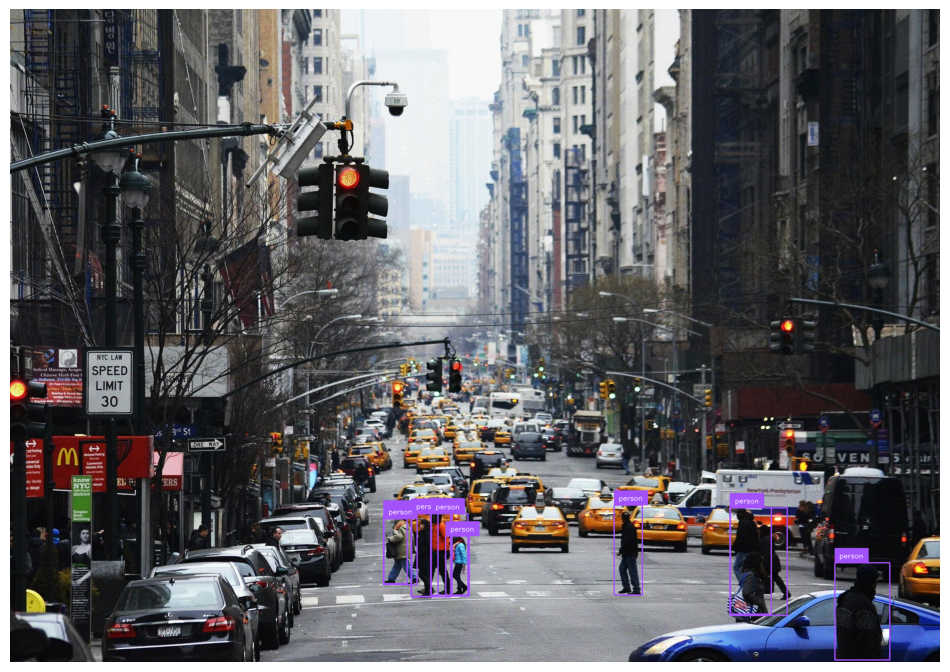

In [35]:
# Filter Detections by specific class

# detections = sv.Detections(...)
model = YOLO("yolov8n.pt")
image = cv2.imread('1.jpg')
results = model(image)[0]
detections = sv.Detections.from_ultralytics(results)
detections = detections[detections.class_id == 0]
bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()

labels = [
    model.model.names[class_id]
    for class_id
    in detections.class_id
]

annotated_image = bounding_box_annotator.annotate(
    scene=image, detections=detections)
BB_CI_annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)

sv.plot_image(BB_CI_annotated_image)


0: 480x640 11 persons, 22 cars, 2 trucks, 7 traffic lights, 212.1ms
Speed: 4.4ms preprocess, 212.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
[2 2 0 9 2 2 0 2 2 7 0 0 9 2 0 2 9 0 2 9 0 2 2 9 2 0 0 2 2 2 0 2 7 2 2 2 0 2 9 2 2 9]
[9 7 9 9 9 9 7 9 9]


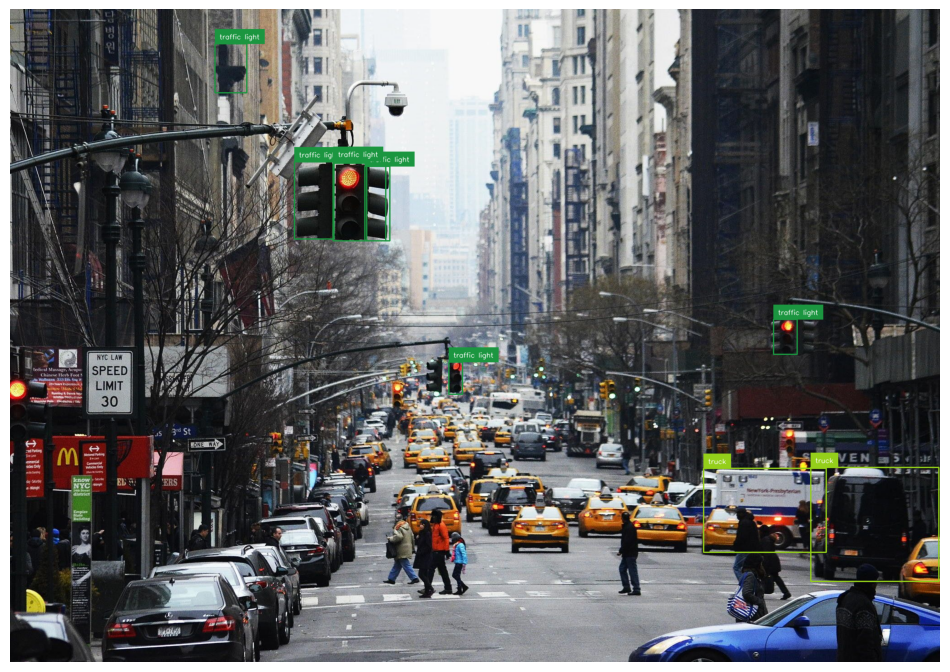

In [44]:
# Filter Detections by selected classes

model = YOLO("yolov8n.pt")
image = cv2.imread('1.jpg')
results = model(image)[0]
detections = sv.Detections.from_ultralytics(results)
print(detections.class_id)
selected_classes = [9,7] # 80 classes (0 to 79)
detections = detections[np.isin(detections.class_id, selected_classes)]
print(detections.class_id)
bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()

labels = [
    model.model.names[class_id]
    for class_id
    in detections.class_id
]

annotated_image = bounding_box_annotator.annotate(
    scene=image, detections=detections)
BB_CI_annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)

sv.plot_image(BB_CI_annotated_image)


In [47]:
# model.model.names

{0: 'person',
 1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 4: 'airplane',
 5: 'bus',
 6: 'train',
 7: 'truck',
 8: 'boat',
 9: 'traffic light',
 10: 'fire hydrant',
 11: 'stop sign',
 12: 'parking meter',
 13: 'bench',
 14: 'bird',
 15: 'cat',
 16: 'dog',
 17: 'horse',
 18: 'sheep',
 19: 'cow',
 20: 'elephant',
 21: 'bear',
 22: 'zebra',
 23: 'giraffe',
 24: 'backpack',
 25: 'umbrella',
 26: 'handbag',
 27: 'tie',
 28: 'suitcase',
 29: 'frisbee',
 30: 'skis',
 31: 'snowboard',
 32: 'sports ball',
 33: 'kite',
 34: 'baseball bat',
 35: 'baseball glove',
 36: 'skateboard',
 37: 'surfboard',
 38: 'tennis racket',
 39: 'bottle',
 40: 'wine glass',
 41: 'cup',
 42: 'fork',
 43: 'knife',
 44: 'spoon',
 45: 'bowl',
 46: 'banana',
 47: 'apple',
 48: 'sandwich',
 49: 'orange',
 50: 'broccoli',
 51: 'carrot',
 52: 'hot dog',
 53: 'pizza',
 54: 'donut',
 55: 'cake',
 56: 'chair',
 57: 'couch',
 58: 'potted plant',
 59: 'bed',
 60: 'dining table',
 61: 'toilet',
 62: 'tv',
 63: 'laptop',
 64: 'mou


0: 480x640 11 persons, 22 cars, 2 trucks, 7 traffic lights, 213.3ms
Speed: 5.5ms preprocess, 213.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
[2 2 0 9 2 2 0 2 2 7 0 0 9 2 0 2 9 0 2 9 0 2 2 9 2 0 0 2 2 2 0 2 7 2 2 2 0 2 9 2 2 9]
[2 2 0 9 2 2 0 2 2 7 0 0 9 2 0 2 9]


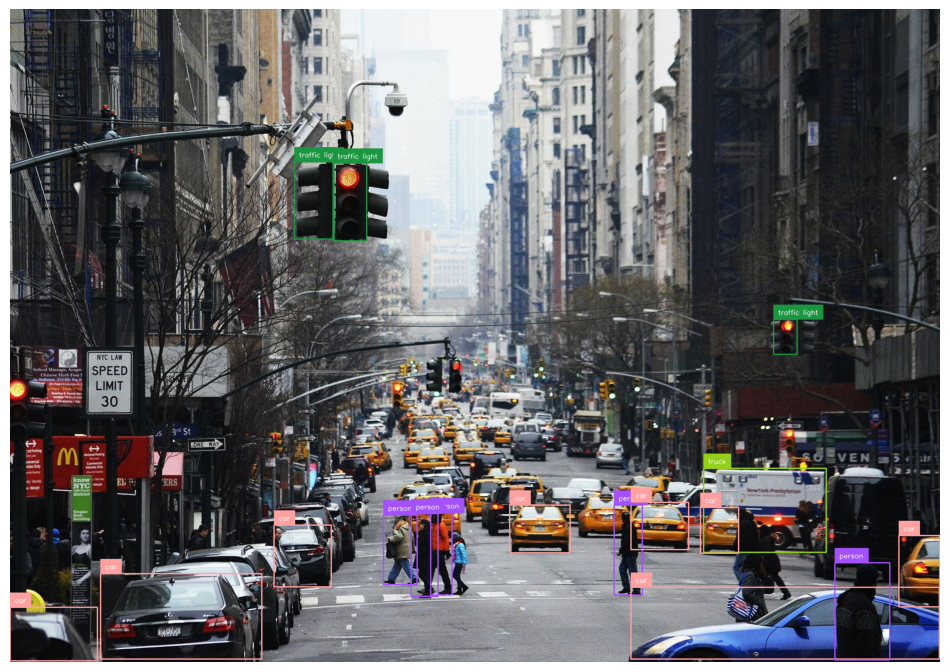

In [51]:
# Filter Detections by confidence

model = YOLO("yolov8n.pt")
image = cv2.imread('1.jpg')
results = model(image)[0]
detections = sv.Detections.from_ultralytics(results)
print(detections.class_id)
detections = detections[detections.confidence > 0.5]
print(detections.class_id)
bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()

labels = [
    model.model.names[class_id]
    for class_id
    in detections.class_id
]

annotated_image = bounding_box_annotator.annotate(
    scene=image, detections=detections)
BB_CI_annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)

sv.plot_image(BB_CI_annotated_image)



0: 480x640 11 persons, 22 cars, 2 trucks, 7 traffic lights, 732.8ms
Speed: 9.8ms preprocess, 732.8ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)
[2 2 0 9 2 2 0 2 2 7 0 0 9 2 0 2 9 0 2 9 0 2 2 9 2 0 0 2 2 2 0 2 7 2 2 2 0 2 9 2 2 9]
[2 2 0 9 2 2 0 2 2 7 0 0 9 2 0 2 9 0 2 9 0 2 2 9 2 0 0 2 2 2 0 2 7 2 2 2 0 2 9 2 2 9]


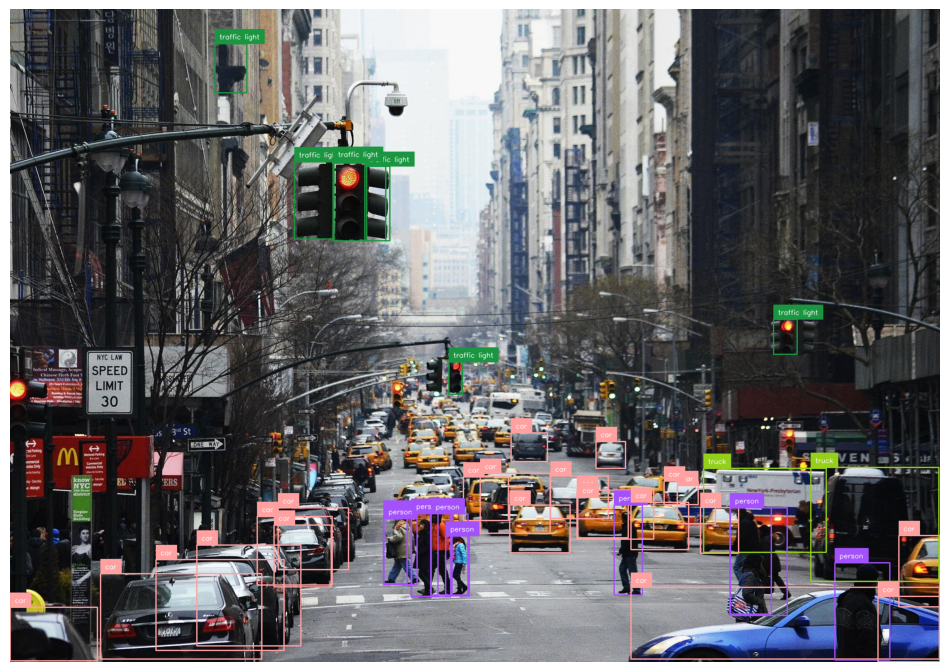

In [52]:
# Filter Detections by area

model = YOLO("yolov8n.pt")
image = cv2.imread('1.jpg')
results = model(image)[0]
detections = sv.Detections.from_ultralytics(results)
print(detections.class_id)
detections = detections[detections.area > 1000]
print(detections.class_id)
bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()

labels = [
    model.model.names[class_id]
    for class_id
    in detections.class_id
]

annotated_image = bounding_box_annotator.annotate(
    scene=image, detections=detections)
BB_CI_annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)

sv.plot_image(BB_CI_annotated_image)



0: 480x640 11 persons, 22 cars, 2 trucks, 7 traffic lights, 233.2ms
Speed: 4.9ms preprocess, 233.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
[2 2 0 9 2 2 0 2 2 7 0 0 9 2 0 2 9 0 2 9 0 2 2 9 2 0 0 2 2 2 0 2 7 2 2 2 0 2 9 2 2 9]
[2 2 0 9 2 2 0 2 2 7 0 0 9 2 0 2 9 0 2 9 0 2 2 9 2 0 0 2 2 2 0 2 7 2 2 2 0 2 9 2 2 9]


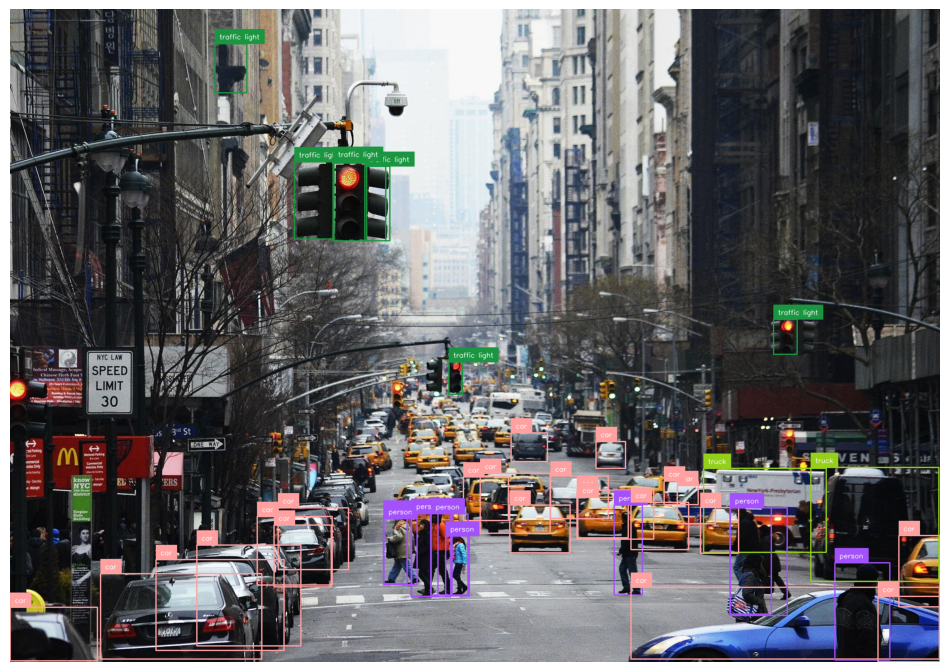

In [53]:
# Filter Detections by relative area

model = YOLO("yolov8n.pt")
image = cv2.imread('1.jpg')
height, width, channels = image.shape
image_area = height * width
results = model(image)[0]
detections = sv.Detections.from_ultralytics(results)
print(detections.class_id)
detections = detections[(detections.area / image_area) < 0.8]
print(detections.class_id)
bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()

labels = [
    model.model.names[class_id]
    for class_id
    in detections.class_id
]

annotated_image = bounding_box_annotator.annotate(
    scene=image, detections=detections)
BB_CI_annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)

sv.plot_image(BB_CI_annotated_image)


In [ ]:
w = detections.xyxy[:, 2] - detections.xyxy[:, 0]
h = detections.xyxy[:, 3] - detections.xyxy[:, 1]
detections = detections[(w > 200) & (h > 200)]


0: 480x640 11 persons, 22 cars, 2 trucks, 7 traffic lights, 175.2ms
Speed: 4.5ms preprocess, 175.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
[2 2 0 9 2 2 0 2 2 7 0 0 9 2 0 2 9 0 2 9 0 2 2 9 2 0 0 2 2 2 0 2 7 2 2 2 0 2 9 2 2 9]
[2 2 2 0 2 2 7 2 0 2 9 2 2 2 7 2 2 2]


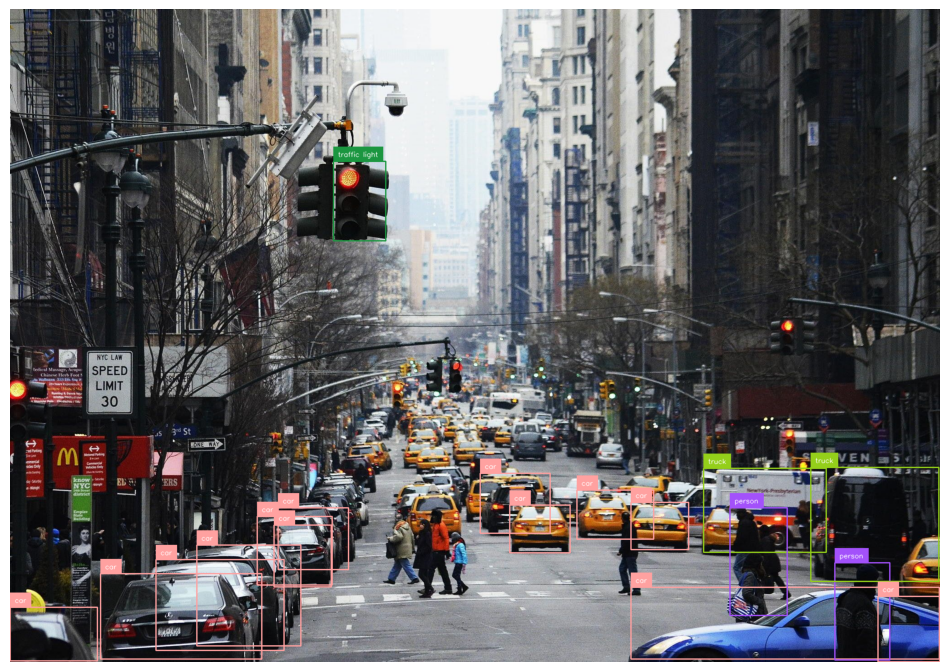

In [55]:
# Filter Detections by by box dimensions

model = YOLO("yolov8n.pt")
image = cv2.imread('1.jpg')
height, width, channels = image.shape
image_area = height * width
results = model(image)[0]
detections = sv.Detections.from_ultralytics(results)
print(detections.class_id)
w = detections.xyxy[:, 2] - detections.xyxy[:, 0]
h = detections.xyxy[:, 3] - detections.xyxy[:, 1]
detections = detections[(w > 100) & (h > 100)]
print(detections.class_id)
bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()

labels = [
    model.model.names[class_id]
    for class_id
    in detections.class_id
]

annotated_image = bounding_box_annotator.annotate(
    scene=image, detections=detections)
BB_CI_annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)

sv.plot_image(BB_CI_annotated_image)
